---
title: "Exploratory Data Analysis"
bibliography: ../../assets/references.bib
format:
    html: 
        code-fold: true
---

Exploratory Data Analysis (EDA) is a crucial beginning step in any data science project. On this page, we will examine distributions, analyze correlations, and uncover relationships between variables, ensuring the data is ready for the modeling phase. These insights will guide and shape our modeling approach. It is important to avoid modeling blindly and instead base our decisions on a thorough understanding of the data.

In [96]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import textwrap
import plotly.express as px
import scipy.stats as stats
from scipy.stats import ttest_ind, skew, kurtosis, f_oneway
import plotly.io as pio
#pio.renderers.default = "notebook"
pio.renderers.default = "plotly_mimetype+notebook_connected"
import warnings
warnings.filterwarnings('ignore')

In [36]:
df = pd.read_csv('../../data/processed-data/processed_df.csv')

## Univariate Analysis

Summary Statistics

In [37]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Enrollment,501.0,568.892216,683.763617,11.00000,287.00000,388.000000,497.0000,5942.00000
Percent Female,501.0,0.488070,0.143794,0.00000,0.43000,0.486000,0.5400,1.00000
Percent Male,501.0,0.511669,0.143896,0.00000,0.46000,0.514000,0.5700,1.00000
Percent Neither Female nor Male,501.0,0.000257,0.000948,0.00000,0.00000,0.000000,0.0000,0.00900
Percent English Language Learners,501.0,0.132874,0.184345,0.00000,0.03900,0.082000,0.1430,0.99400
Percent Students with IEPs,501.0,0.209673,0.080834,0.00000,0.16500,0.208000,0.2630,0.62900
Economic Need Index,501.0,0.730691,0.237780,0.00000,0.69000,0.813000,0.8810,0.94900
Percent Overage / Undercredited,501.0,0.054353,0.054019,0.00000,0.01800,0.041000,0.0690,0.30800
Percent in Temp Housing,501.0,0.130513,0.079141,0.00600,0.08100,0.119000,0.1650,0.56000
Percent HRA Eligible,501.0,0.700184,0.153327,0.00000,0.64200,0.737000,0.8120,0.94700


### Transformations

View distribution of numerical features with histogram

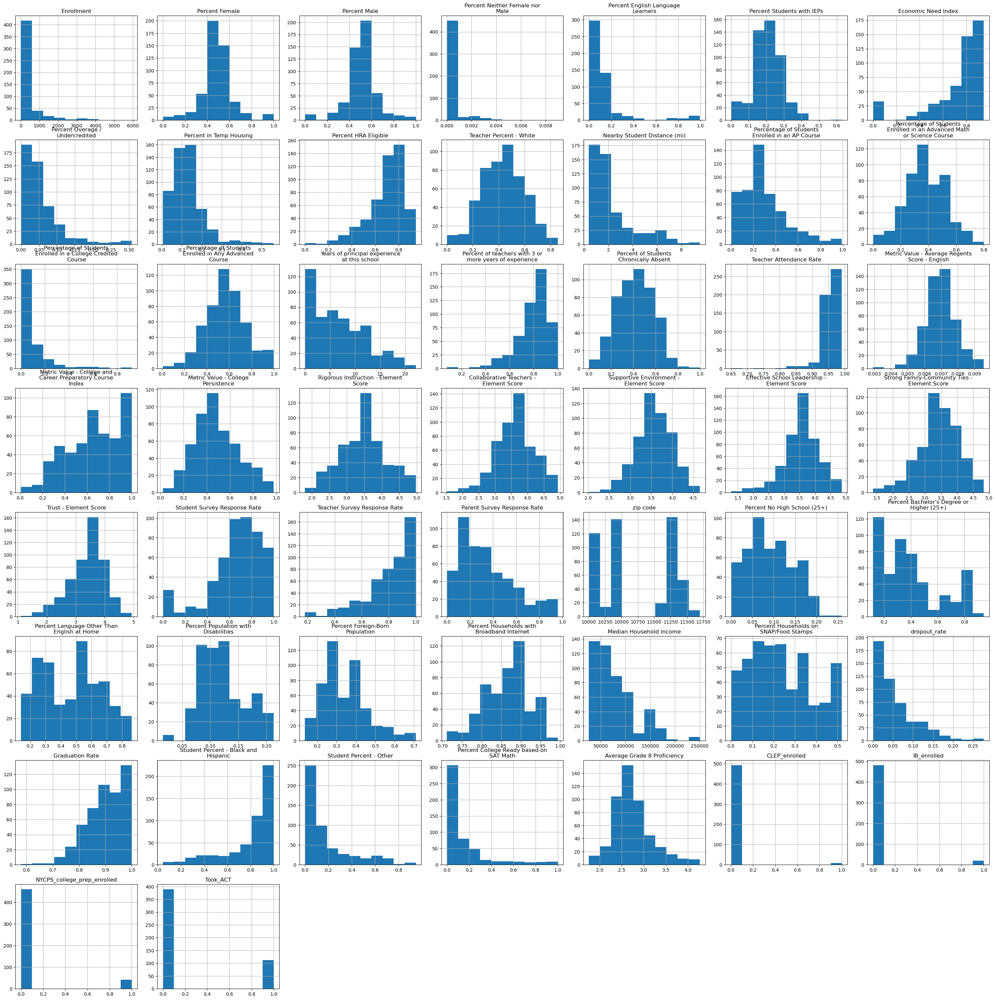

In [38]:
numerical_columns = df.select_dtypes(include=['float64']).columns

axes = df[numerical_columns].hist(figsize=(30, 30))
plt.tight_layout()

# wrap the titles for readability
for ax, col in zip(axes.flatten(), numerical_columns):
    wrapped_title = textwrap.fill(col, width=30)
    ax.set_title(wrapped_title)

plt.show()

Based on these distributions, we may want to transform some variables before modeling. Lets check the actual skews:

In [39]:
skewness = df.apply(lambda col: skew(col) if col.dtype != 'object' else None)

In [40]:
skewness.loc[abs(skewness) > 1]

Enrollment                                                      3.738744
Percent Neither Female nor Male                                 5.155183
Percent English Language Learners                               3.151075
Economic Need Index                                            -1.952382
Percent Overage / Undercredited                                 2.173497
Percent in Temp Housing                                         1.785170
Percent HRA Eligible                                           -1.271196
Nearby Student Distance (mi)                                    1.538479
Percentage of Students Enrolled in a College Credited Course    2.898833
Percent of teachers with 3 or more years of experience         -1.445006
Teacher Attendance Rate                                        -5.282616
Student Survey Response Rate                                   -1.222827
Teacher Survey Response Rate                                   -1.131656
Median Household Income                            

I will take the log of some variables of interest exhibiting the power law

In [86]:
df_transformed = df.copy()

df_transformed['log_dropout_rate'] = np.log(df_transformed['dropout_rate'] + 1)
df_transformed['log_temp_housing'] = np.log(df_transformed['Percent in Temp Housing'] + 1)
df_transformed['log_percent_overage'] = np.log(df_transformed['Percent Overage / Undercredited'] + 1)
df_transformed['log_enrollment'] = np.log(df_transformed['Enrollment'] + 1)
df_transformed['log_nearby_student_distance'] = np.log(df_transformed['Nearby Student Distance (mi)'] + 1)
df_transformed['log_household_income'] = np.log(df_transformed['Median Household Income'] + 1)


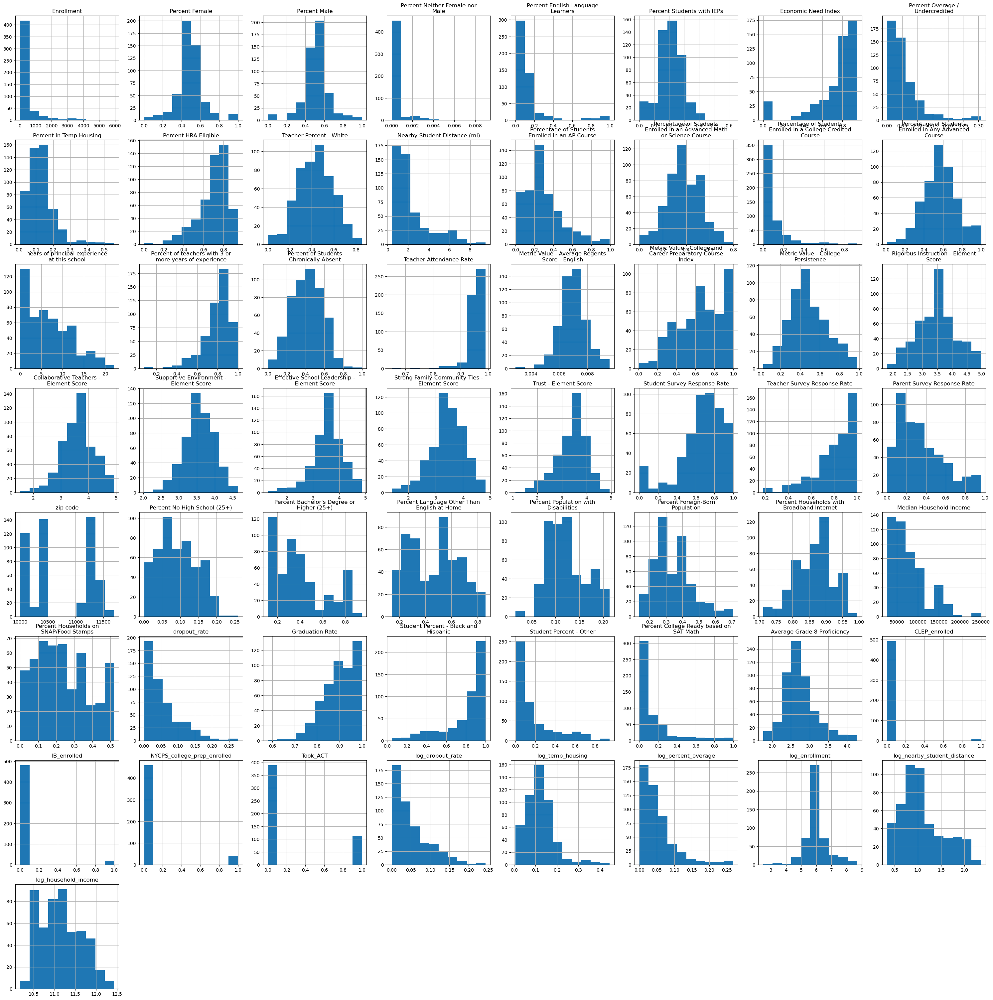

In [87]:
numerical_columns = df_transformed.select_dtypes(include=['float64']).columns

axes = df_transformed[numerical_columns].hist(figsize=(30, 30))
plt.tight_layout()

# wrap the titles for readability
for ax, col in zip(axes.flatten(), numerical_columns):
    wrapped_title = textwrap.fill(col, width=30)
    ax.set_title(wrapped_title)

plt.show()

The distribution of drop out rate, temp housing, nearby student distance, enrollment, and household income seem more normally distributed now. I will drop the original columns and save this dataframe for later use in regression analysis. 

In [88]:
df_transformed.drop(columns=['dropout_rate','Percent in Temp Housing','Enrollment','Nearby Student Distance (mi)','Median Household Income','Percent Overage / Undercredited'], axis=1, inplace=True)
df_transformed.to_csv('../../data/processed-data/transformed_df.csv')

### Multivariate Analysis

Visualize correlations with heatmap of all numeric columns from original dataset

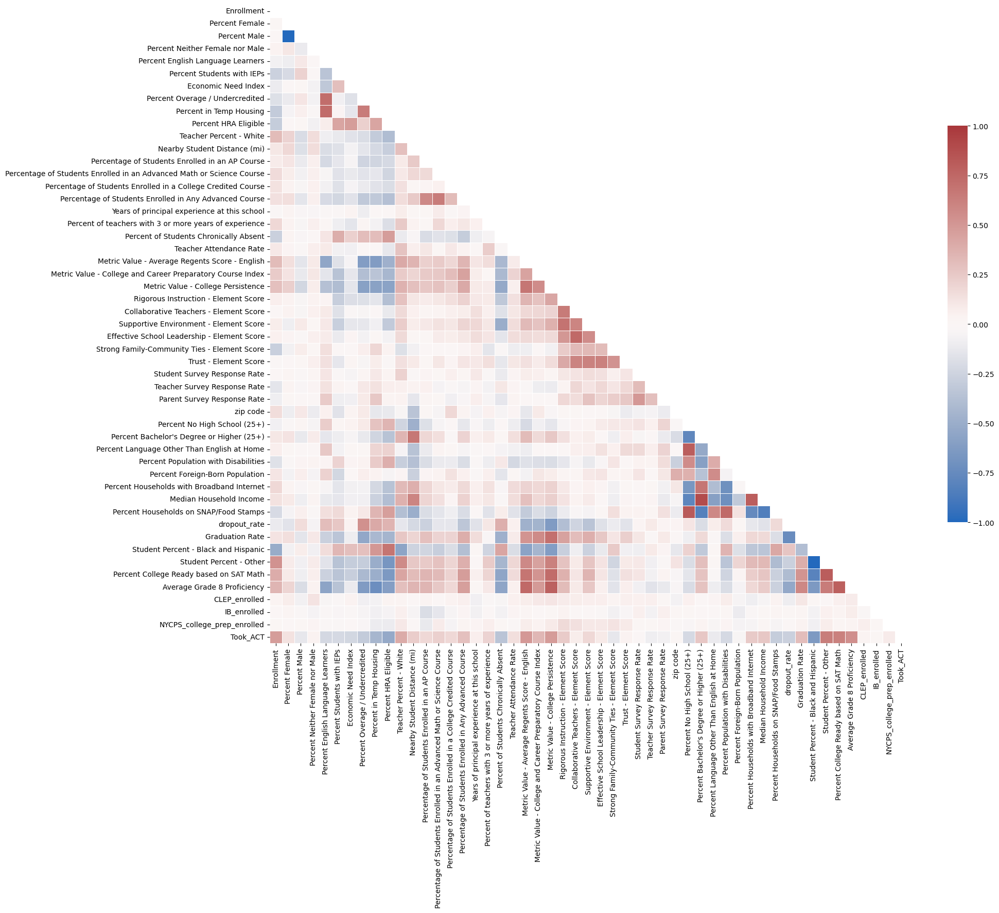

In [69]:
numeric_columns = df.select_dtypes(include=['float64'])
corr = numeric_columns.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(20, 20))  
sns.heatmap(corr, mask=mask, cmap='vlag', vmin=-1, vmax=1, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()

It looks like there are some high correlations, specifically some data that is perfectly multicollinear. For example 'Percent Female' and 'Percent Male' is nearly perfectly negatively correlated and 'Student Percent - Black and Hispanic' and 'Student Percent - Other' is perfectly negatively correlated since there are only two population groups.This will have to be removed for modeling.

## Statistical Testing

Lets try to uncover relationships between some of our target variables and features in the data

#### T-test
I will use a t test to evaluate if there is difference in the means of two groups

##### Dropout Rate vs Median Household Income

First, I want to see if there is a relationship between median household income and dropout rate. Looking at the graph, it appears that high median income is associated with low dropout rates. I will do a t-test to validate this assumption.

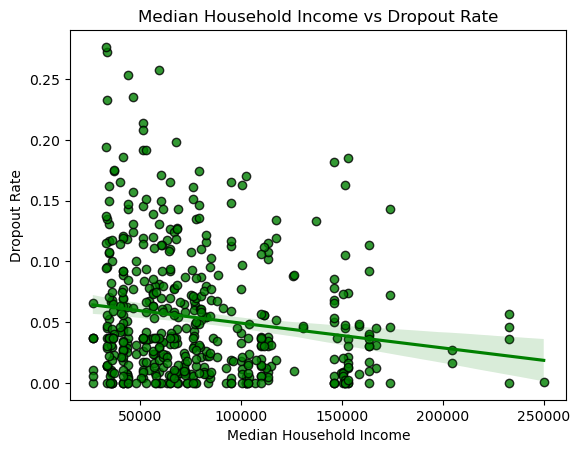

In [70]:
sns.regplot(data=df, y='dropout_rate', x='Median Household Income', scatter_kws={'edgecolor': 'black'}, color='green')
plt.title('Median Household Income vs Dropout Rate')
plt.ylabel('Dropout Rate')
plt.xlabel('Median Household Income')
plt.show()

In [73]:
high_dropout = df[df['dropout_rate'] > .077]['Median Household Income']
low_dropout = df[df['dropout_rate'] <= .077]['Median Household Income']

t_stat, p_value = ttest_ind(high_dropout, low_dropout)
print(f't-value = {t_stat:.2f}, p-value = {p_value:.3f}')

t-value = -2.79, p-value = 0.006


- *Null Hypothesis:* There is no difference in mean median household income between schools with high dropout and low dropout rates.

- *Alternative Hypothesis:* There is a difference in mean median household income between schools with high and low droppout rates

- **Conclusion:** The p-value is 0.006, allowing us to reject the null hypothesis and conclude that there is significant difference in the mean median household income of schools with high dropout rates vs low dropout rates.

##### Chronic Absenteeism vs Supportive School Environment

Now I want to check the relationship between chronic absenteeism and a supportive school environment.

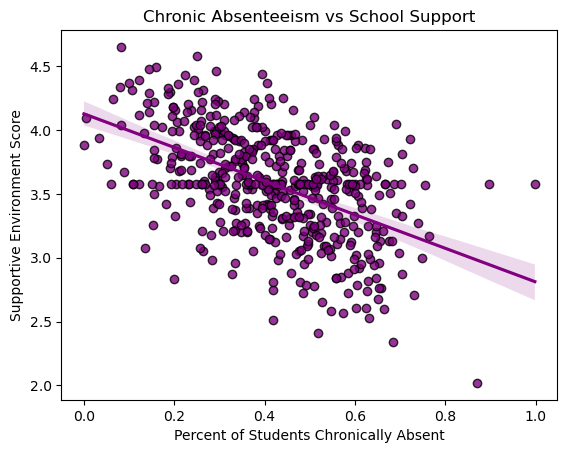

In [74]:
sns.regplot(data=df, x='Percent of Students Chronically Absent', y='Supportive Environment - Element Score', scatter_kws={'edgecolor': 'black'}, color='purple')
plt.title('Chronic Absenteeism vs School Support')
plt.xlabel('Percent of Students Chronically Absent')
plt.ylabel('Supportive Environment Score')
plt.show()

It appears that lower supportive environment scores is associated with high rates of chronic absenteeism. We can do a t-test to validate the assumption that there is a difference in supportive score for schools with high and low chronic absenteeism

In [75]:
high_chronic_absent = df[df['Percent of Students Chronically Absent'] > .4]['Supportive Environment - Element Score']
low_chronic_absent = df[df['Percent of Students Chronically Absent'] <= .4]['Supportive Environment - Element Score']

t_stat, p_value = ttest_ind(high_chronic_absent, low_chronic_absent)
print(f't-value = {t_stat:.2f}, p-value = {p_value:.3f}')

t-value = -11.44, p-value = 0.000


- *Null Hypothesis:* There is no difference in mean supportive environment score between schools with high chronic absenteeism and low chronic absenteeism.

- *Alternative Hypothesis:* There is a difference in mean supportive environment score between schools with high chronic absenteeism and low chronic absenteeism.

- **Conclusion:** The p-value is less than 0.05, allowing us to reject the null hypothesis and conclude that there is significant difference in the mean supportive environment element score of schools with high chronic absenteeism vs low chronic absenteeism.

#### ANOVA

An ANOVA test is used to evaluate if there is a difference in the means of more than two groups

#### Economic Need Index vs College Persistence Rates

The Economic Need Index estimates the percentage of the students at the school facing economic hardship. [@NYCPublicSchoolsInfoHub_2024] As shown by the box plot, it looks like low rates of college persistence is associated with high Economic Need Index. I will use an ANOVA test to see if there is a statistical difference in Economic Need Index between these three groups of persistence rates.

In [76]:
df['college_persistence_ranking'] = pd.cut(df['Metric Value - College Persistence'], bins=3, labels=['Low','Medium','High'])

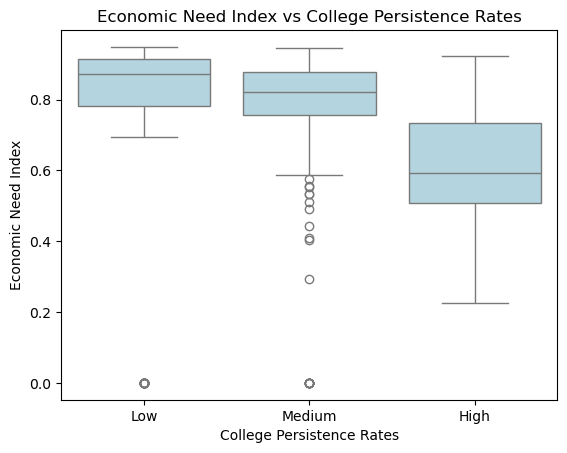

In [77]:
sns.boxplot(data=df, x='college_persistence_ranking', y='Economic Need Index',color='lightblue')
plt.title('Economic Need Index vs College Persistence Rates')
plt.xlabel('College Persistence Rates')
plt.ylabel('Economic Need Index')
plt.show()

In [78]:
anova_result = f_oneway(
    df[df['college_persistence_ranking']=='Low']['Economic Need Index'],
    df[df['college_persistence_ranking']=='Medium']['Economic Need Index'],
    df[df['college_persistence_ranking']=='High']['Economic Need Index']
)
print(f'F value = {anova_result.statistic:.2f}, p-value = {anova_result.pvalue:.3f}')


F value = 21.57, p-value = 0.000


- *Null Hypothesis:* There is no difference in mean economic need index between schools with high, medium, and low college persistence rates.

- *Alternative Hypothesis:* There is a difference in mean economic need index between schools with high, medium, and low college persistence rates.

- **Conclusion:** The p-value less than 0.05, allowing us to reject the null hypothesis and conclude that there is significant difference in the mean economic need index between at least one of the college persistence ranking groups (High, Medium, Low).

## Additional Visualizations

Taking a look at a box plot of dropout rates by borough, it is apparent that the Bronx has the highest rates of dropout. In addition, the median for Queens is low but there are some high outliers.

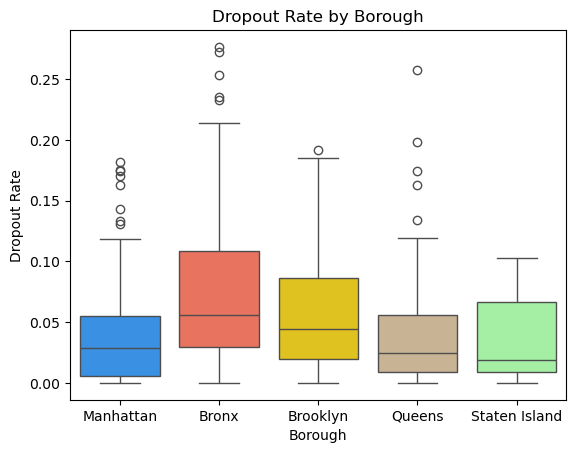

In [97]:
colors = ['#1E90FF','#FF6347','#FFD700','#D2B48C', '#98FB98']
sns.boxplot(x='Borough', y='dropout_rate', data=df, palette=colors)
plt.title('Dropout Rate by Borough')
plt.ylabel('Dropout Rate')
plt.show()

Looking at chronic absenteeism and dropout rates by district, certain districts clearly have higher medians and IQRs, especially some high spread and outliers in district 84 for chronic abseentism, and a high drop out rate in district 12.

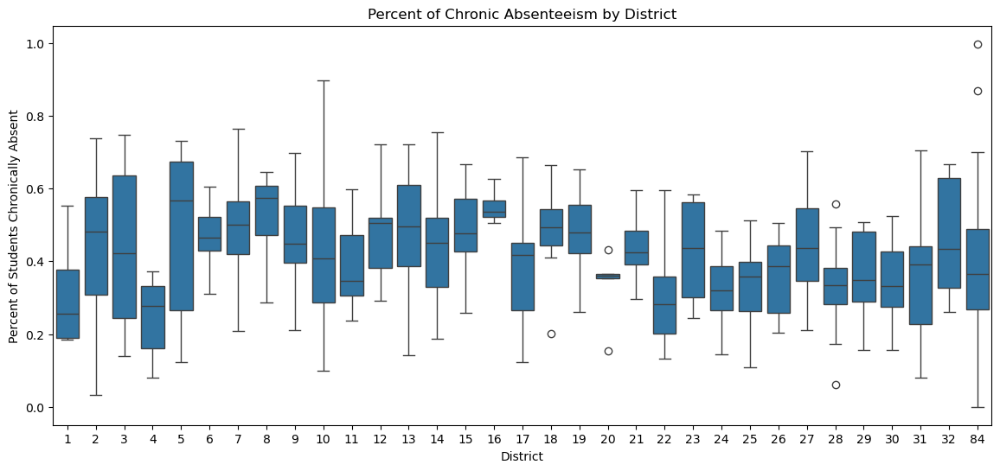

In [80]:
plt.figure(figsize=(14, 6))
sns.boxplot(data=df, x='District', y='Percent of Students Chronically Absent')
plt.title('Percent of Chronic Absenteeism by District')
plt.show()

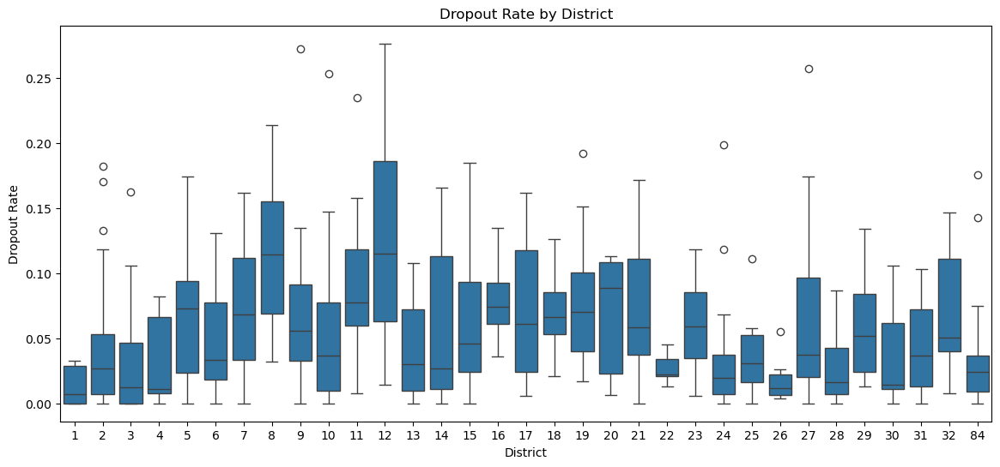

In [82]:
plt.figure(figsize=(14, 6))
sns.boxplot(data=df, x='District', y='dropout_rate')
plt.title('Dropout Rate by District')
plt.ylabel('Dropout Rate')
plt.show()

It appears that high college persistence is associated with high average grade 8 proficiency. This emphasizes the importance of early intervention.

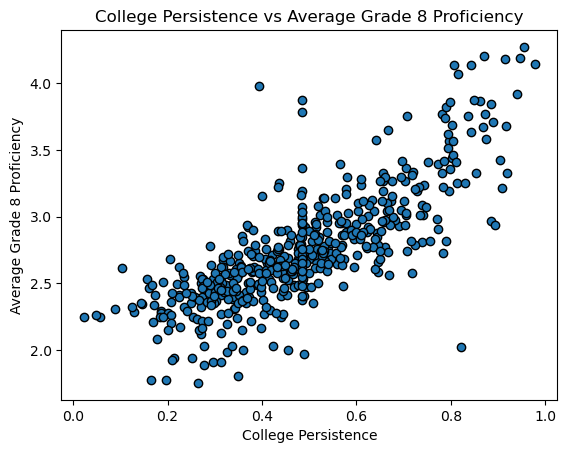

In [83]:
plt.scatter(data=df, x='Metric Value - College Persistence', y='Average Grade 8 Proficiency', edgecolors='black')
plt.title('College Persistence vs Average Grade 8 Proficiency')
plt.xlabel('College Persistence')
plt.ylabel('Average Grade 8 Proficiency')
plt.show()

Lets take a look at how all three of our target metrics work together in this interactive plot

In [84]:
fig = px.scatter(df, x='Percent of Students Chronically Absent', y='dropout_rate', color='Metric Value - College Persistence')
fig.update_layout(title='Percent of Student Chronically Absent vs Dropout Rate', xaxis_title='Percent of Students Chronically Absent', yaxis_title='Dropout Rate')
fig.show()

It looks like high rates of college persistence are associated with low dropout rates and low percentages of student chronically absent - a motivating example of why we need to intervene to reduce these two metrics in order to maximize college persistence!

## Feature Selection

For further analysis, we will do some feature selection to help us prepare for modeling

Lets check what columns are most correlated with our regression target, from our transformed data


In [89]:
numeric_columns = df_transformed.select_dtypes(include=['float64'])

target_column = 'Percent of Students Chronically Absent'

correlations = numeric_columns.corr()[target_column].sort_values(ascending=False)

positive_correlations = correlations[correlations > 0]
negative_correlations = correlations[correlations < 0]

print(positive_correlations.head(10).sort_values(ascending=False))
print(negative_correlations.sort_values(ascending=True).head(15)) 

Percent of Students Chronically Absent    1.000000
Percent HRA Eligible                      0.476284
Student Percent - Black and Hispanic      0.434400
log_dropout_rate                          0.386007
Percent Students with IEPs                0.383127
log_temp_housing                          0.331457
log_percent_overage                       0.323949
Economic Need Index                       0.215888
Percent English Language Learners         0.110565
Teacher Survey Response Rate              0.102258
Name: Percent of Students Chronically Absent, dtype: float64
Average Grade 8 Proficiency                                    -0.558927
Percent College Ready based on SAT Math                        -0.554737
Metric Value - College Persistence                             -0.526158
Supportive Environment - Element Score                         -0.507653
Graduation Rate                                                -0.477225
Student Percent - Other                                        -

In [90]:
features = df_transformed[[ "Percent of Students Chronically Absent",
    "Percent HRA Eligible",
    "Student Percent - Black and Hispanic",
    "Percent Students with IEPs",
    "log_dropout_rate",
    "log_temp_housing",
    "log_percent_overage",
    "Economic Need Index",
    "Percent English Language Learners",
    "Average Grade 8 Proficiency",
    "Percent College Ready based on SAT Math",
    "Metric Value - College Persistence",
    "Supportive Environment - Element Score",
    "Graduation Rate",
    "Metric Value - Average Regents Score - English",
    "Metric Value - College and Career Preparatory Course Index",
    "Took_ACT", 'Rigorous Instruction - Element Score','Percentage of Students Enrolled in Any Advanced Course','log_enrollment']]

Now we have a dataset of 20 features. 

We can visualize these correlations using pairplot, we want to make sure there are no zero looking correlations, or something that looks like a big blob of dots with no apparent relationship

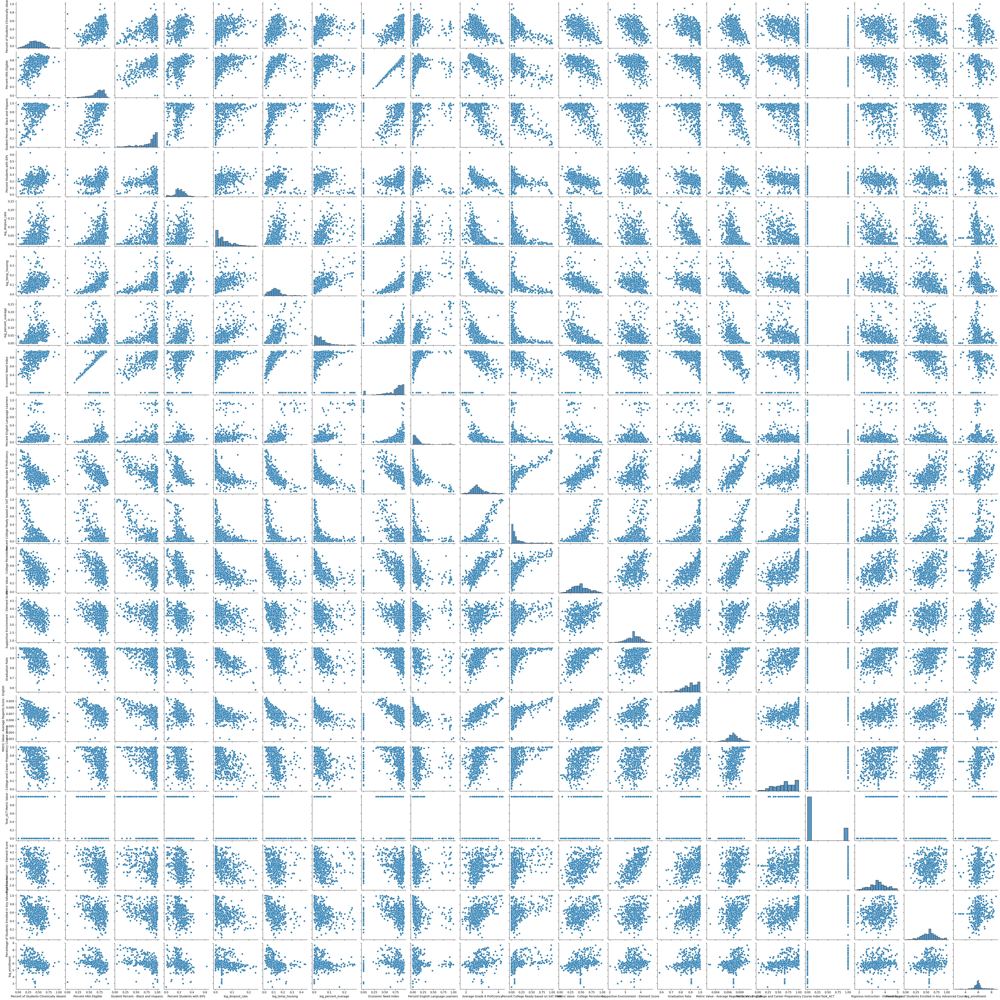

In [91]:
sns.pairplot(features)

Now we should check the pairwise correlations to ensure that we dont have variables that are too correlated to each other

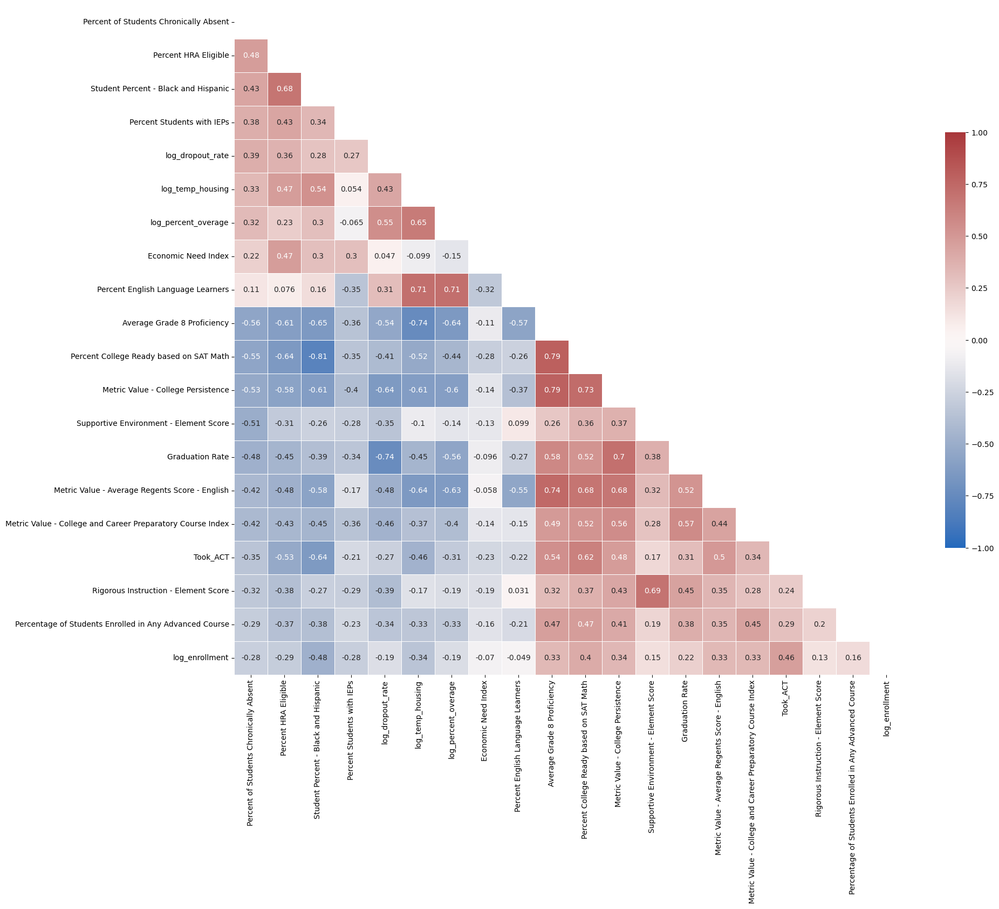

In [92]:
corr = features.corr()
f, ax = plt.subplots(figsize=(20, 20))  
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr,  mask=mask, cmap='vlag', annot=True, vmin=-1, vmax=1, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()

There appears to be relationships with our target and all the features we have included, plus not too high correlations (nothing greater than |0.85|) between the features. Lets export this dataframe for our regression models.

In [93]:
features.to_csv('../../data/processed-data/df_subset_regression.csv', index=False)

### Conclusion

The EDA process has provided us with valuable insights into the data, which will guide and shape the modeling process. By examining distributions, correlations, and relationships between variables, we have identified potential issues such as skewness and multicollinearity, which help identify transformations and feature engineering necessary. For example, I applied log transformations to variables exhibiting power law distributions, resulted in more normally distributed data, a key assumption for regression analysis.

I also identified significant relationships between several variables and our target metrics. T-tests showed significant differences in median household income between schools with high and low dropout rates, as well as significant differences in supportive school environment scores between schools with high and low chronic absenteeism. Similarly, the ANOVA test revealed that the there is a significant difference in Economic Need Index for schools with different levels of college persistence. These findings all highlighting the importance of addressing socioeconomic and school quality factors to improve student outcomes.

Geographic analysis further identified areas where intervention may be necessary, such as high dropout rates in the Bronx and high chronic absenteeism in district 84. 

### Next Steps
 - Data Preprocessing for Modeling: Apply transformations and drop multicollinear features that were identified using correlation heatmap.
- Modeling: Develop regression models to predict chronic absenteeism and classification models to identify schools with high dropout rate and low college persistence rates.
- Investigate additional transformations or feature engineering that can improve model performance.

These findings highlight the necessity to design targeted interventions in districts with high dropout rates or chronic absenteeism, focusing on socioeconomic factors and school environment. The goal is to build predictive models that can help inform these interventions to improve high school outcomes in New York City.